# Time Series Analysis of Team Statistics


In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import yaml
from IPython.display import Markdown, display
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from scipy.stats import linregress

In [2]:
# load yaml
with open("config.yaml", "r") as f:
    config = yaml.safe_load(f)
    DATA_PATH = config.get("data_path")
    if DATA_PATH is None:
        print("ERROR: No data path provided")
    USE_DRIVE = bool(config.get("use_drive", False))

In [3]:
# load from drive if requested
if USE_DRIVE:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


# Load data

In [5]:
# load team data
team_statistics_df = pd.read_csv(os.path.join(DATA_PATH, "team_statistics.csv"))
team_statistics_df.info()
team_statistics_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91649 entries, 0 to 91648
Data columns (total 47 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   gameId                   91649 non-null  int64  
 1   gameDate                 91649 non-null  object 
 2   teamCity                 91649 non-null  object 
 3   teamName                 91649 non-null  object 
 4   teamId                   91649 non-null  int64  
 5   opponentTeamCity         91649 non-null  object 
 6   opponentTeamName         91649 non-null  object 
 7   opponentTeamId           91649 non-null  int64  
 8   home                     91649 non-null  int64  
 9   win                      91649 non-null  int64  
 10  teamScore                91649 non-null  int64  
 11  opponentScore            91649 non-null  int64  
 12  assists                  91645 non-null  float64
 13  blocks                   91632 non-null  float64
 14  steals                

,gameId,gameDate,teamCity,teamName,teamId,opponentTeamCity,opponentTeamName,opponentTeamId,home,win,...,biggestScoringRun,leadChanges,pointsFastBreak,pointsFromTurnovers,pointsInThePaint,pointsSecondChance,timesTied,timeoutsRemaining,seasonWins,seasonLosses
0,22401058,2025-03-26 22:00:00,Boston,Celtics,1610612738,Phoenix,Suns,1610612756,0,1,...,15.0,0.0,9.0,16.0,44.0,17.0,0.0,1.0,54.0,19.0
1,22401058,2025-03-26 22:00:00,Phoenix,Suns,1610612756,Boston,Celtics,1610612738,1,0,...,10.0,0.0,9.0,7.0,36.0,16.0,0.0,1.0,35.0,38.0
2,22401057,2025-03-26 21:00:00,Denver,Nuggets,1610612743,Milwaukee,Bucks,1610612749,1,1,...,9.0,2.0,20.0,18.0,64.0,16.0,4.0,1.0,46.0,28.0
3,22401057,2025-03-26 21:00:00,Milwaukee,Bucks,1610612749,Denver,Nuggets,1610612743,0,0,...,7.0,2.0,5.0,17.0,56.0,13.0,4.0,0.0,40.0,32.0
4,22401054,2025-03-26 19:30:00,Brooklyn,Nets,1610612751,Toronto,Raptors,1610612761,1,0,...,8.0,0.0,12.0,7.0,46.0,12.0,1.0,1.0,23.0,50.0


In [8]:
# time series where gameDate is the time column
team_statistics_df["gameDate"] = pd.to_datetime(team_statistics_df["gameDate"])

In [9]:
# drop columns not needed
cols_to_drop = ["gameId", "teamCity", "teamName", "opponentTeamCity", "opponentTeamName",
                "fieldGoalsAttempted", "fieldGoalsMade",
                "threePointersAttempted", "threePointersMade",
                "freeThrowsAttempted", "freeThrowsMade",
                "reboundsDefensive", "reboundsOffensive"
                ]
team_df = team_statistics_df
team_df.drop(columns=cols_to_drop, inplace=True)

In [10]:
team_df.head()

,gameDate,teamId,opponentTeamId,home,win,teamScore,opponentScore,assists,blocks,steals,...,biggestScoringRun,leadChanges,pointsFastBreak,pointsFromTurnovers,pointsInThePaint,pointsSecondChance,timesTied,timeoutsRemaining,seasonWins,seasonLosses
0,2025-03-26 22:00:00,1610612738,1610612756,0,1,132,102,33.0,7.0,8.0,...,15.0,0.0,9.0,16.0,44.0,17.0,0.0,1.0,54.0,19.0
1,2025-03-26 22:00:00,1610612756,1610612738,1,0,102,132,22.0,3.0,7.0,...,10.0,0.0,9.0,7.0,36.0,16.0,0.0,1.0,35.0,38.0
2,2025-03-26 21:00:00,1610612743,1610612749,1,1,127,117,36.0,4.0,6.0,...,9.0,2.0,20.0,18.0,64.0,16.0,4.0,1.0,46.0,28.0
3,2025-03-26 21:00:00,1610612749,1610612743,0,0,117,127,30.0,6.0,4.0,...,7.0,2.0,5.0,17.0,56.0,13.0,4.0,0.0,40.0,32.0
4,2025-03-26 19:30:00,1610612751,1610612761,1,0,86,116,16.0,9.0,6.0,...,8.0,0.0,12.0,7.0,46.0,12.0,1.0,1.0,23.0,50.0


In [8]:
team_df.describe()

,gameDate,teamId,opponentTeamId,home,win,teamScore,opponentScore,assists,blocks,steals,...,biggestScoringRun,leadChanges,pointsFastBreak,pointsFromTurnovers,pointsInThePaint,pointsSecondChance,timesTied,timeoutsRemaining,seasonWins,seasonLosses
count,91649,9.164900e+04,9.164900e+04,91649.000000,91649.000000,91649.000000,91649.000000,91645.000000,91632.000000,91341.000000,...,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000,2150.000000
mean,2006-01-14 20:38:55.725649024,1.610613e+09,1.610613e+09,0.499471,0.498347,102.799725,102.828869,23.115991,5.003121,7.905628,...,10.153488,6.716279,15.486512,17.525116,48.939535,14.128372,4.840930,0.452093,18.233023,18.280465
min,1981-11-03 20:00:00,1.610613e+09,1.610613e+09,0.000000,0.000000,49.000000,49.000000,4.000000,0.000000,0.000000,...,5.000000,0.000000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1996-03-17 20:00:00,1.610613e+09,1.610613e+09,0.000000,0.000000,93.000000,93.000000,19.000000,3.000000,6.000000,...,8.000000,2.000000,11.000000,13.000000,42.000000,10.000000,2.000000,0.000000,8.000000,8.000000
50%,2006-03-10 19:00:00,1.610613e+09,1.610613e+09,0.000000,0.000000,102.000000,102.000000,23.000000,5.000000,8.000000,...,10.000000,5.000000,15.000000,17.000000,48.000000,14.000000,4.000000,0.000000,16.000000,17.000000
75%,2015-12-07 19:30:00,1.610613e+09,1.610613e+09,1.000000,1.000000,112.000000,112.000000,27.000000,7.000000,10.000000,...,12.000000,10.000000,20.000000,22.000000,56.000000,18.000000,7.000000,1.000000,27.000000,27.000000
max,2025-03-26 22:00:00,1.610613e+09,1.610613e+09,1.000000,1.000000,176.000000,176.000000,52.000000,23.000000,27.000000,...,24.000000,42.000000,46.000000,45.000000,88.000000,36.000000,22.000000,1.000000,60.000000,57.000000
std,NaN,8.560837e+00,8.562666e+00,0.500002,0.500000,13.700946,13.710616,5.524858,2.654206,3.046092,...,2.674992,6.056848,6.614039,6.710324,10.397187,5.706591,4.124381,0.497815,12.536114,12.495395


## EDA

In [9]:
team_df.columns

Index(['gameDate', 'teamId', 'opponentTeamId', 'home', 'win', 'teamScore',
       'opponentScore', 'assists', 'blocks', 'steals', 'fieldGoalsPercentage',
       'threePointersPercentage', 'freeThrowsPercentage', 'reboundsTotal',
       'foulsPersonal', 'turnovers', 'plusMinusPoints', 'numMinutes',
       'q1Points', 'q2Points', 'q3Points', 'q4Points', 'benchPoints',
       'biggestLead', 'biggestScoringRun', 'leadChanges', 'pointsFastBreak',
       'pointsFromTurnovers', 'pointsInThePaint', 'pointsSecondChance',
       'timesTied', 'timeoutsRemaining', 'seasonWins', 'seasonLosses'],
      dtype='object')

In [14]:
# plot all cols, except teamId and opponentTeamId in a line plot wehre gameDate is on the x axis
# plot all of them in one big plot with subplots
def plot_all_cols(df, cols, plot_width=12):
    # need at least two cols
    if len(cols) < 2:
        raise ValueError("Need at least two cols")
    dont_plot = ["teamId", "opponentTeamId"]
    df = df.drop(columns=dont_plot, errors="ignore")
    fig, axs = plt.subplots(nrows=len(cols), ncols=1, figsize=(plot_width,4*len(cols)))
    for i, col in enumerate(cols):
        if col not in dont_plot:
            axs[i].plot(df["gameDate"], df[col])
            axs[i].set_title(col)
            axs[i].set_xlabel("gameDate")
            axs[i].set_ylabel(col)
            # more space between the plots
            plt.subplots_adjust(hspace=0.5)
    plt.show()

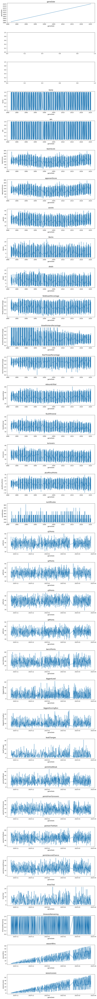

In [42]:
plot_all_cols(team_df, team_df.columns)

Okay this is now the plot for all teams, this is not very helpful.

However, we can see that some statistic was only started to be collected later. Thus, let's split agian the `df` and select only those columns which have the record since 1981

In [ ]:
cols_to_keep = []
# select only cols which have a min value in the year 1981
for col in team_df.columns:
    if col == "gameDate":
        continue
    # if we would select only that col and gameDate, would the min of gameDate be 1981?
    col_df = team_df[["gameDate", col]]
    # drop all nan and 0s
    col_df = col_df.dropna()
    col_df = col_df[col_df[col] != 0]
    # get min
    min_year = col_df["gameDate"].min().year
    if min_year == 1981:
        cols_to_keep.append(col)

team_df = team_df[["gameDate"] + cols_to_keep]
team_df.describe()

,gameDate,teamId,opponentTeamId,home,win,teamScore,opponentScore,assists,blocks,steals,fieldGoalsPercentage,threePointersPercentage,freeThrowsPercentage,reboundsTotal,foulsPersonal,turnovers,plusMinusPoints,numMinutes
count,91649,9.164900e+04,9.164900e+04,91649.000000,91649.000000,91649.000000,91649.000000,91645.000000,91632.000000,91341.000000,91649.000000,91649.000000,91649.00000,91649.000000,91649.000000,91595.000000,91015.000000,91649.000000
mean,2006-01-14 20:38:55.725649024,1.610613e+09,1.610613e+09,0.499471,0.498347,102.799725,102.828869,23.115991,5.003121,7.905628,0.460987,0.343249,0.75815,42.767919,21.562505,14.847546,0.123782,241.713057
min,1981-11-03 20:00:00,1.610613e+09,1.610613e+09,0.000000,0.000000,49.000000,49.000000,4.000000,0.000000,0.000000,0.234000,0.000000,0.00000,17.000000,4.000000,1.000000,-73.000000,240.000000
25%,1996-03-17 20:00:00,1.610613e+09,1.610613e+09,0.000000,0.000000,93.000000,93.000000,19.000000,3.000000,6.000000,0.422000,0.261000,0.69600,38.000000,18.000000,12.000000,-9.000000,240.000000
50%,2006-03-10 19:00:00,1.610613e+09,1.610613e+09,0.000000,0.000000,102.000000,102.000000,23.000000,5.000000,8.000000,0.460000,0.345000,0.76500,43.000000,21.000000,15.000000,1.000000,240.000000
75%,2015-12-07 19:30:00,1.610613e+09,1.610613e+09,1.000000,1.000000,112.000000,112.000000,27.000000,7.000000,10.000000,0.500000,0.429000,0.82600,47.000000,25.000000,17.000000,9.000000,240.000000
max,2025-03-26 22:00:00,1.610613e+09,1.610613e+09,1.000000,1.000000,176.000000,176.000000,52.000000,23.000000,27.000000,0.697000,1.000000,1.00000,81.000000,52.000000,40.000000,73.000000,365.000000
std,NaN,8.560837e+00,8.562666e+00,0.500002,0.500000,13.700946,13.710616,5.524858,2.654206,3.046092,0.057522,0.147039,0.10003,6.751799,4.754360,4.148831,13.745173,7.328626


## Let's select some teams

In [ ]:
def plot_time_series(dataframes, columns, fig_colsize=6):
    # Number of columns excluding 'gameDate'
    num_columns = len(columns) - 1

    fig, axes = plt.subplots(nrows=num_columns, ncols=len(dataframes), figsize=(fig_colsize*len(dataframes), num_columns * 3), sharex=True)

    # Iterate over each dataframe and each column
    for col_idx, column in enumerate(columns):
        if column == 'gameDate':
            continue

        for df_idx, df in enumerate(dataframes):
            ax = axes[col_idx-1, df_idx] if num_columns > 1 else axes[df_idx]
            ax.plot(df['gameDate'], df[column], label=f'DF {df_idx + 1}')
            ax.set_title(f'{column} (DF {df_idx + 1})')
            ax.set_xlabel('Game Date')
            ax.set_ylabel(column)
            ax.grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()

In [ ]:
# select 3 teams randomly and plot the plots for those
teamsIds = team_df["teamId"].unique()
np.random.seed(42)
teamsIds_chosen = np.random.choice(teamsIds, 3, replace=False)

teamsIds_chosen

# create 3 data frames selected only by those teams
team_dfs_chosen = []
for teamId in teamsIds_chosen:
    team_dfs_chosen.append(team_df[team_df["teamId"] == teamId])

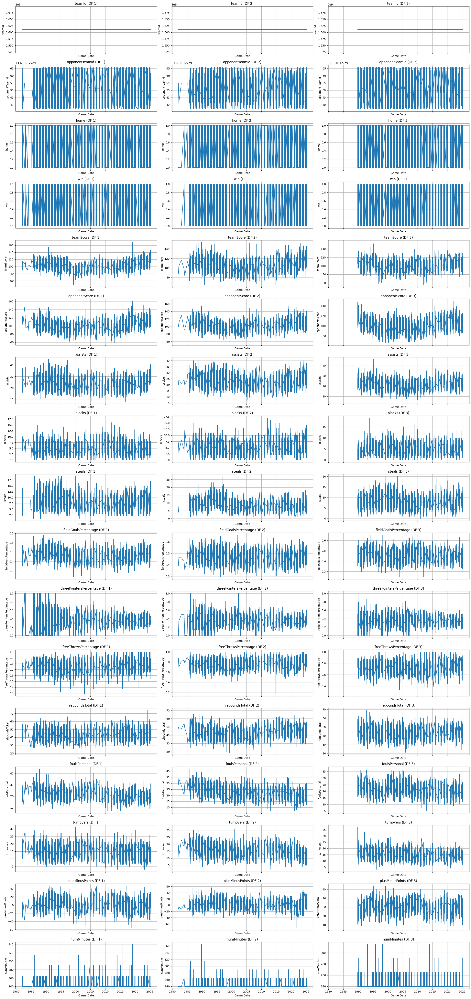

In [ ]:
# plot teams
plot_time_series(team_dfs_chosen, team_dfs_chosen[0].columns, fig_colsize=8)

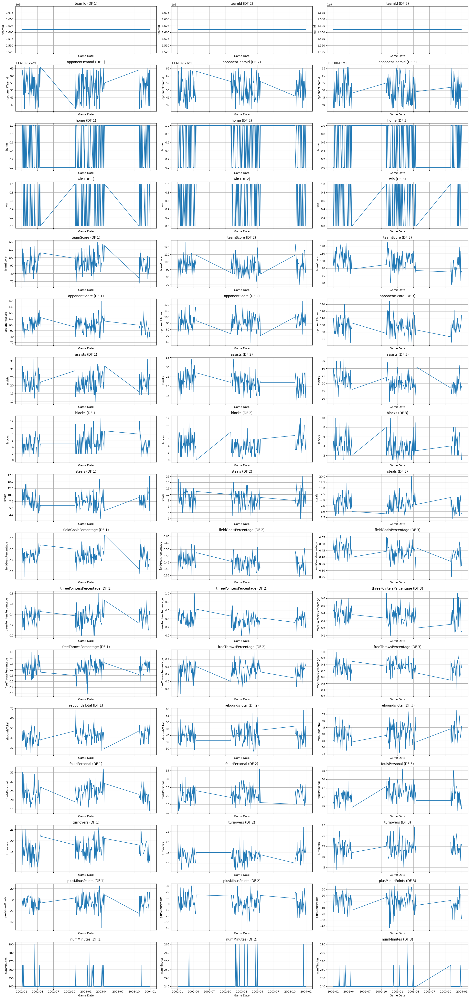

In [ ]:
# hard to tell something, lets select only one year

year = 2002

team_dfs_chosen_year = []
for t in team_dfs_chosen:
    # filter for rows that are in the year 'year' or year+1
    team_dfs_chosen_year.append(t[t["gameDate"].dt.year.isin([year, year+1])])

# plot again
plot_time_series(team_dfs_chosen_year, team_dfs_chosen_year[0].columns, fig_colsize=8)

`NumMinutes` probably not good.

# TS analysis of teamScore

## Seasonal decompose

In [11]:
team_score_df = team_df[["gameDate", "teamScore", "opponentScore"]]
team_score_df.set_index("gameDate", inplace=True)
team_score_df.sort_index(inplace=True, ascending=True)
team_score_df.head()
team_score_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 91649 entries, 1981-11-03 20:00:00 to 2025-03-26 22:00:00
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   teamScore      91649 non-null  int64
 1   opponentScore  91649 non-null  int64
dtypes: int64(2)
memory usage: 2.1 MB


<ipython-input-11-cc3ca1f777c8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_score_df.sort_index(inplace=True, ascending=True)


In [12]:
team_score_df.describe()

,teamScore,opponentScore
count,91649.000000,91649.000000
mean,102.799725,102.828869
std,13.700946,13.710616
min,49.000000,49.000000
25%,93.000000,93.000000
50%,102.000000,102.000000
75%,112.000000,112.000000
max,176.000000,176.000000


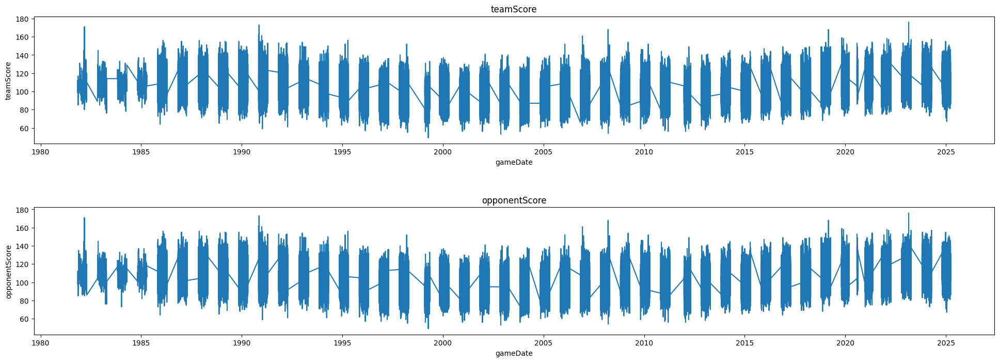

In [15]:
# plot again the teamScore
plot_all_cols(team_df, ["teamScore", "opponentScore"], plot_width=24)


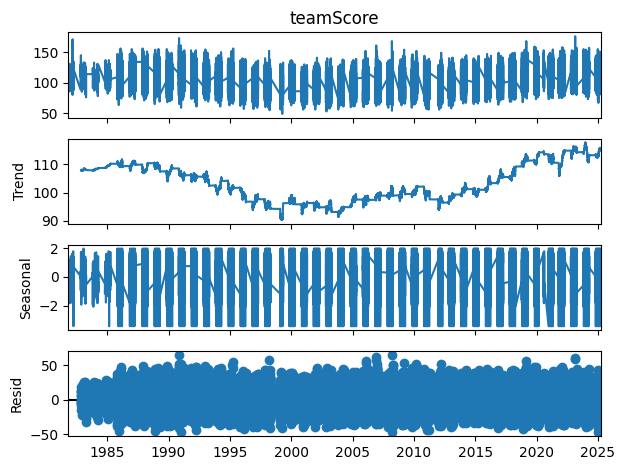

In [16]:
# seasonal decompose
decomposition = seasonal_decompose(team_score_df["teamScore"], model='additive', period=365)

# plot
decomposition.plot()
plt.show()

Seasonal decomposition analysis:

- The trend looks not really monotonically increasing, but also not constant... -> think more about what that means
- the season variance is fairly constant during the seasonal games (always between boundaries of $\pm 2$
- the error looks random and symetric around the 0 which is good

**analyze rule changes**: below after first arima section -> with new normalized data frame

## ARIMA

**find out if stationary or non-stationary**
- todo remove trend

First we need to find arima params $p,d,q$

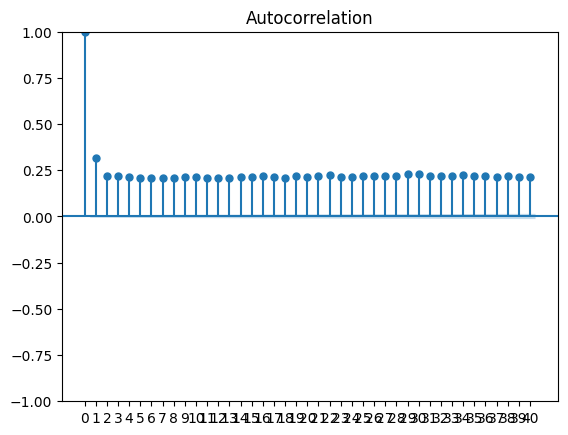

In [17]:
# identify sarima parameters
# acf plot
plot_acf(team_score_df["teamScore"], lags=40)
# ticks
plt.xticks(np.arange(0, 41, 1))
plt.show()

acf indicates almost 0 at $q=1$

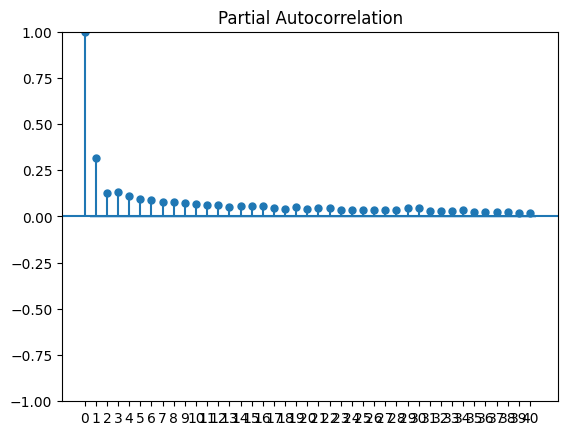

In [18]:
# pac plot
plot_pacf(team_score_df["teamScore"], lags=40)
# ticks
plt.xticks(np.arange(0, 41, 1))
plt.show()

pac indicates almost 0 at $p = 2$

In [19]:
q = 1
p = 2
d = 0

In [20]:
sarima_model = SARIMAX(team_score_df["teamScore"], order=(p, d, q))
sarima_model_fit = sarima_model.fit()

print(sarima_model_fit.summary())

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                               SARIMAX Results                                
Dep. Variable:              teamScore   No. Observations:                91649
Model:               SARIMAX(2, 0, 1)   Log Likelihood             -358195.073
Date:                Mon, 28 Apr 2025   AIC                         716398.146
Time:                        16:26:12   BIC                         716435.849
Sample:                             0   HQIC                        716409.633
                              - 91649                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1304      0.002    476.961      0.000       1.126       1.135
ar.L2         -0.1304      0.002    -55.008      0.000      -0.135      -0.126
ma.L1         -0.9952      0.000  -3106.688      0.0

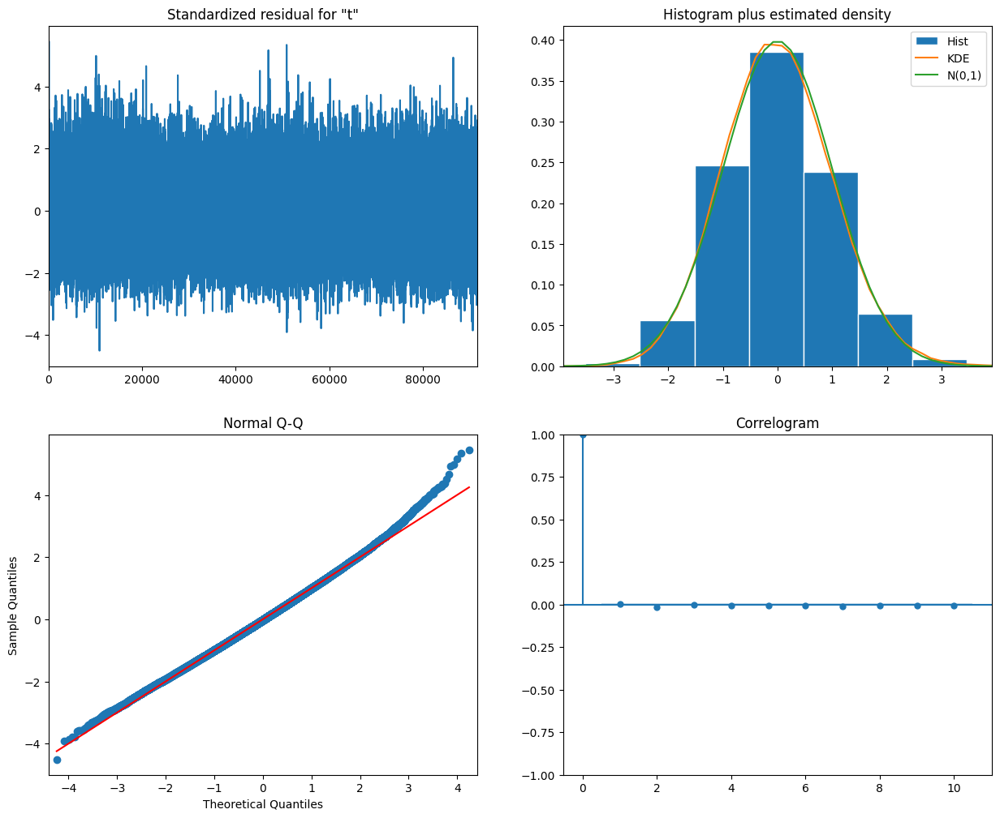

In [21]:
# plot residuals
sarima_model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

- The standardized residials look fairly random
- the histogram is normal distributed
- same for the qq plot
- the correlation has one spike for the x=0
  - does not change, even if we increase p or q

**todo: prediction**
- who wins -> todo how exactly?
- acf/pacf: how many games before are relevant to predict the next one -> window size for predictions


**todo: arima with multiple predictors**
- e.g. points, assists, etc. is relevant to predict total score (of game)
- then predict for team a and b the each the teamScore (based on the last n games) and then compare
- or predict the win (todo find out what is easier)

# With normalized data set

in the mean time we normalized the dataset of team statistics

In [6]:
team_stat_df = pd.read_csv(os.path.join(DATA_PATH, "team_statistics_important_features.csv"))
team_stat_df["gameDate"] = pd.to_datetime(team_statistics_df["gameDate"])
team_stat_df.sort_index(inplace=True, ascending=False)
team_stat_df.set_index("gameDate", inplace=True)
team_stat_df.head()

,gameId,teamCity,teamName,opponentTeamCity,opponentTeamName,home,win,teamScore,opponentScore,threePointersPercentage,...,blocksPerPossession,stealsPerPossession,threePointersAttemptedPerPossession,freeThrowsAttemptedPerPossession,reboundsDefensivePerPossession,reboundsOffensivePerPossession,foulsPersonalPerPossession,turnoversPerPossession,effectiveFieldGoalPercentage,trueShootingPercentage
gameDate,,,,,,,,,,,,,,,,,,,,,
1985-12-11 20:00:00,22300001,Indiana,Pacers,Cleveland,Cavaliers,1,1,121,116,0.484,...,0.046057,0.064480,0.285556,0.221076,0.303979,0.064480,0.165807,0.175018,45.180233,0.626553
1985-12-11 20:00:00,22300001,Cleveland,Cavaliers,Indiana,Pacers,0,0,116,121,0.286,...,0.087379,0.097087,0.271845,0.242718,0.291262,0.048544,0.194175,0.126214,44.166667,0.610526
1985-12-11 20:00:00,22300002,New York,Knicks,Milwaukee,Bucks,0,0,105,110,0.256,...,0.009804,0.058824,0.382353,0.245098,0.392157,0.156863,0.215686,0.107843,38.203125,0.490654
1985-12-11 20:00:00,22300002,Milwaukee,Bucks,New York,Knicks,1,1,110,105,0.513,...,0.108567,0.059218,0.384919,0.276352,0.335570,0.069088,0.157916,0.138176,35.237805,0.583121
1985-12-11 20:00:00,22300005,Oklahoma City,Thunder,Golden State,Warriors,1,0,139,141,0.517,...,0.009242,0.027726,0.268022,0.277264,0.231054,0.064695,0.184843,0.175601,50.174699,0.722453


In [7]:
team_stat_df.describe()

,gameId,home,win,teamScore,opponentScore,threePointersPercentage,freeThrowsPercentage,assistsPerPossession,blocksPerPossession,stealsPerPossession,threePointersAttemptedPerPossession,freeThrowsAttemptedPerPossession,reboundsDefensivePerPossession,reboundsOffensivePerPossession,foulsPersonalPerPossession,turnoversPerPossession,effectiveFieldGoalPercentage,trueShootingPercentage
count,9.062600e+04,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000,90626.000000
mean,2.396538e+07,0.500971,0.502229,102.861949,102.730872,0.344394,0.758440,0.236305,0.051224,0.080653,0.191254,0.254790,0.316363,0.121571,0.220415,0.151277,38.758672,0.542695
std,3.869620e+06,0.500002,0.499998,13.696542,13.701247,0.145489,0.099999,0.053676,0.027147,0.030177,0.106875,0.080383,0.054707,0.044612,0.047334,0.040316,5.757298,0.061948
min,2.000000e+07,0.000000,0.000000,49.000000,49.000000,0.000000,0.000000,0.043422,0.000000,0.000000,0.007403,0.010369,0.079554,0.000000,0.044504,0.010762,16.123077,0.279808
25%,2.090050e+07,0.000000,0.000000,93.000000,93.000000,0.263000,0.696000,0.198747,0.031250,0.059328,0.109127,0.197666,0.278850,0.089820,0.187578,0.123153,35.060000,0.500180
50%,2.180108e+07,1.000000,1.000000,102.000000,102.000000,0.346000,0.765000,0.234423,0.048419,0.078678,0.178855,0.249674,0.315831,0.117693,0.218477,0.149509,38.227813,0.541297
75%,2.890067e+07,1.000000,1.000000,112.000000,112.000000,0.429000,0.826000,0.271536,0.067358,0.099880,0.262826,0.306036,0.353270,0.149288,0.251362,0.177655,42.209677,0.583839
max,2.990119e+07,1.000000,1.000000,176.000000,176.000000,1.000000,1.000000,0.491453,0.230203,0.262850,0.673884,0.746269,0.544233,0.389335,0.489983,0.338948,68.018018,0.808484


In [8]:
team_stat_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 90626 entries, 1985-12-11 20:00:00 to 2025-03-26 22:00:00
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   gameId                               90626 non-null  int64  
 1   teamCity                             90626 non-null  object 
 2   teamName                             90626 non-null  object 
 3   opponentTeamCity                     90626 non-null  object 
 4   opponentTeamName                     90626 non-null  object 
 5   home                                 90626 non-null  int64  
 6   win                                  90626 non-null  int64  
 7   teamScore                            90626 non-null  int64  
 8   opponentScore                        90626 non-null  int64  
 9   threePointersPercentage              90626 non-null  float64
 10  freeThrowsPercentage                 90626 non-null  float6

In [9]:
def plot_time_series_separated(overall_df, column, separation_dates: list[int, str] = None, fig_colsize=24, fig_rowsize=3, rolling_mean_window_size=30, yticks=None, scatter=True, sep_line_width=1):

    # plot whole ts
    fig, ax = plt.subplots(figsize=(fig_colsize, fig_rowsize))
    if scatter:
        ax.scatter(overall_df.index, overall_df[column], label=f'{column} (Overall)')
    else:
        ax.plot(overall_df.index, overall_df[column], label=f'{column} (Overall)')

    # plot separation lines
    if separation_dates is not None:
        for indexdate in separation_dates:
            index, date = indexdate
            ax.axvline(x=index, color='red', linestyle='-', linewidth=sep_line_width, label=f"rule change of {date}")
            # add under the line a text with the date, rotated 90 degrees, offset by a few pixels
            ax.text(index, overall_df[column].max(), date, ha='right', va='bottom', color='red', rotation=90)

    if rolling_mean_window_size is not None:
        # plot moving average
        rolling_mean = overall_df[column].rolling(window=rolling_mean_window_size).mean()
        ax.plot(overall_df.index, rolling_mean, label=f'Rolling Mean ({rolling_mean_window_size} days)', color='orange')
        ax.legend()

    # labels
    ax.set_title(f'{column} (Overall)')
    ax.set_xlabel('Game Date')
    ax.set_ylabel(column)
    ax.grid(True)
    if yticks is not None:
        ax.set_yticks(yticks)
    ax.xaxis.set_major_locator(plt.MaxNLocator(10))

    plt.show()


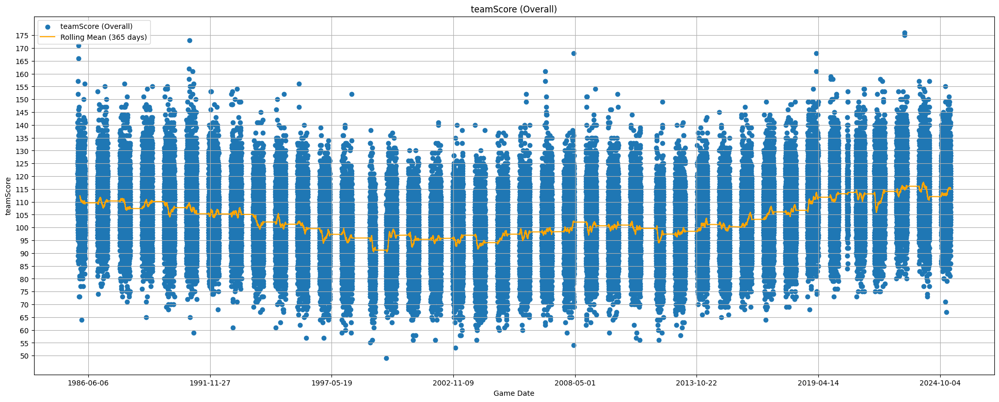

In [10]:
# plot
plot_time_series_separated(team_stat_df, "teamScore", fig_rowsize=9, yticks=np.arange(50, 180, 5), rolling_mean_window_size=365)

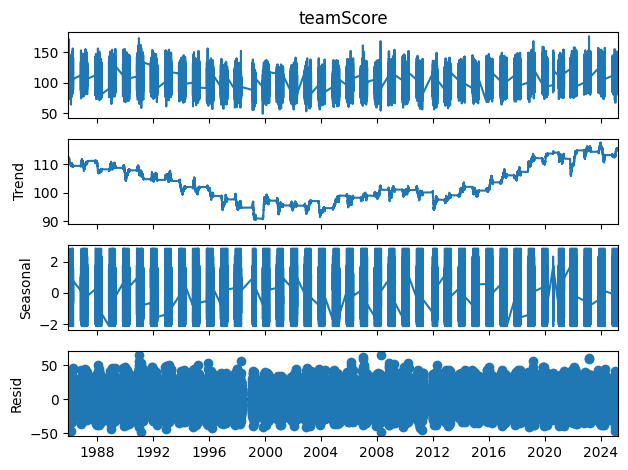

In [11]:
# seasonal decompose
decomposition = seasonal_decompose(team_stat_df["teamScore"], model='additive', period=365)

# plot
decomposition.plot()
plt.show()

## Seasonal Decompose with uniform time stamps


Converting the dataset to a uniform integer index because we want to ignore the actual time gaps and focus purely on the sequence of games. We are interested in patterns within the games themselves (e.g., trends in scores across games in a season) rather than the actual calendar time. And the time gaps (off-season) are not relevant to your analysis.


In [12]:
# uniform index df
team_stat_ui_df = team_stat_df.copy()
team_stat_ui_df.sort_values("gameDate", inplace=True, ascending=False)

# reset the index to a uniform integer index
team_stat_ui_df.reset_index(drop=True, inplace=True)

# new column for the uniform integer index (optional, for clarity)
team_stat_ui_df["gameDate"] = team_stat_df.index

In [13]:
team_stat_ui_df.head()

,gameId,teamCity,teamName,opponentTeamCity,opponentTeamName,home,win,teamScore,opponentScore,threePointersPercentage,...,stealsPerPossession,threePointersAttemptedPerPossession,freeThrowsAttemptedPerPossession,reboundsDefensivePerPossession,reboundsOffensivePerPossession,foulsPersonalPerPossession,turnoversPerPossession,effectiveFieldGoalPercentage,trueShootingPercentage,gameDate
0,22401058,Boston,Celtics,Phoenix,Suns,0,1,132,102,0.423,...,0.081900,0.532351,0.225225,0.378788,0.112613,0.184275,0.102375,45.292135,0.668829,1985-12-11 20:00:00
1,22401058,Phoenix,Suns,Boston,Celtics,1,0,102,132,0.317,...,0.071254,0.417345,0.213762,0.274837,0.111971,0.183225,0.132329,36.235632,0.529925,1985-12-11 20:00:00
2,22401057,Denver,Nuggets,Milwaukee,Bucks,1,1,127,117,0.432,...,0.059595,0.367501,0.218514,0.377433,0.079460,0.119190,0.089392,49.205556,0.637039,1985-12-11 20:00:00
3,22401057,Milwaukee,Bucks,Denver,Nuggets,0,0,117,127,0.432,...,0.040933,0.378633,0.133033,0.317233,0.081867,0.143266,0.112567,46.207865,0.617610,1985-12-11 20:00:00
4,22401055,Los Angeles,Lakers,Indiana,Pacers,0,1,120,119,0.447,...,0.052323,0.397656,0.251151,0.366262,0.083717,0.230222,0.146505,41.240506,0.669942,1985-12-11 20:00:00


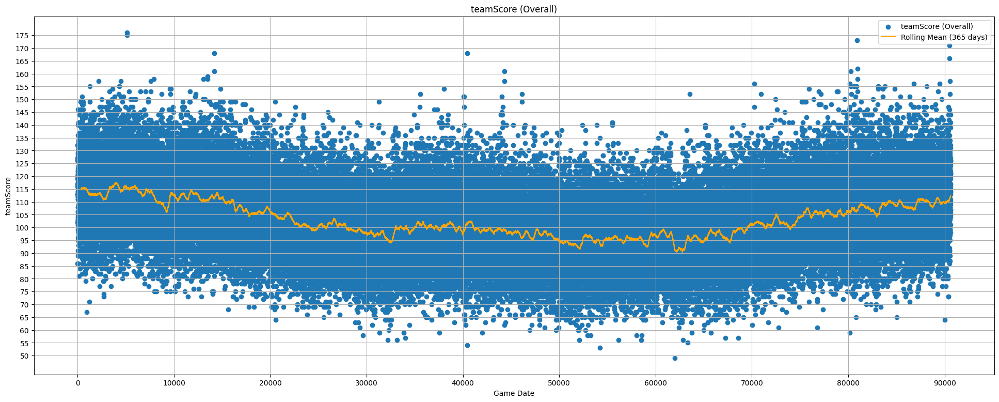

In [14]:
# plot it again
plot_time_series_separated(team_stat_ui_df, "teamScore", fig_rowsize=9, yticks=np.arange(50, 180, 5), rolling_mean_window_size=365)

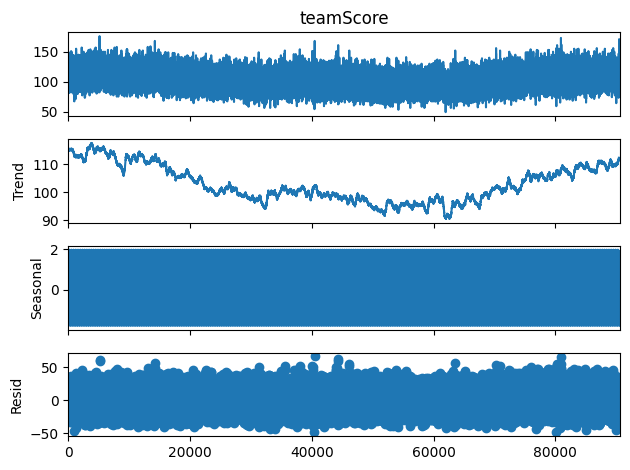

In [15]:
# seasonal decompose
decomposition_ui = seasonal_decompose(team_stat_ui_df["teamScore"], model='additive', period=365)

# plot
decomposition_ui.plot()
plt.show()

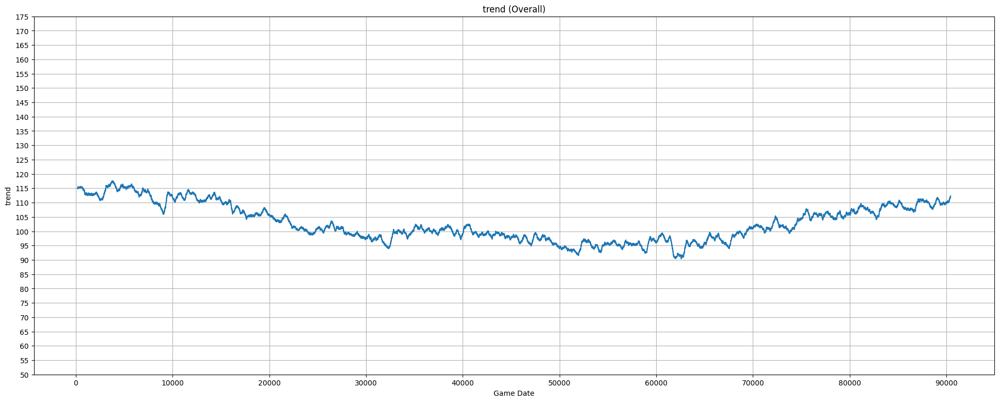

In [16]:
# plot trends
trend_ui = decomposition_ui.trend

# to df
trend_ui = pd.DataFrame(trend_ui)
trend_ui.columns = ["trend"]

plot_time_series_separated(trend_ui, "trend", fig_rowsize=9, yticks=np.arange(50, 180, 5), scatter=False, rolling_mean_window_size=None)

# Major rule changes analysis

 Key Rule Changes:
- 1954: Shot Clock Introduced
- 1964: Lane expanded
- 1979: Hand-Checking Banned
- 1980: Three-Point Line introduced
- 1995: Three-Point Line moved closer and stricter hand-checking rules
- 2002: Zone Defense Legalized
- 2005: Hand Checking Banned Permanently

## Data Prep

In [17]:
# split df into those periods: [-inf, 1994], [1995, 2001], [2002,2004], [2005, today]
separation_dates = ["1995-01-01", "2002-01-01", "2005-01-01"]
team_stat_df_three_point_line_introduced = team_stat_ui_df[team_stat_ui_df["gameDate"] < separation_dates[0]]
team_stat_df_three_point_line_moved = team_stat_ui_df[(team_stat_ui_df["gameDate"] >= separation_dates[0]) & (team_stat_ui_df["gameDate"] < separation_dates[1])]
team_stat_df_zone_defense_legalized = team_stat_ui_df[(team_stat_ui_df["gameDate"] >= separation_dates[1]) & (team_stat_ui_df["gameDate"] < separation_dates[2])]
team_stat_df_hand_checking_banned = team_stat_ui_df[team_stat_ui_df["gameDate"] >= separation_dates[2]]

In [18]:
# sort by index
team_stat_df_three_point_line_introduced.sort_index(inplace=True, ascending=True)
team_stat_df_three_point_line_introduced.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18570 entries, 0 to 18569
Data columns (total 23 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   gameId                               18570 non-null  int64         
 1   teamCity                             18570 non-null  object        
 2   teamName                             18570 non-null  object        
 3   opponentTeamCity                     18570 non-null  object        
 4   opponentTeamName                     18570 non-null  object        
 5   home                                 18570 non-null  int64         
 6   win                                  18570 non-null  int64         
 7   teamScore                            18570 non-null  int64         
 8   opponentScore                        18570 non-null  int64         
 9   threePointersPercentage              18570 non-null  float64       
 10  freeThrowsPerce

In [19]:
# get the index that's closest to the dates
separation_indexes = []
for d in separation_dates:
     target_date = pd.to_datetime(d)
     date_differences = abs(team_stat_ui_df["gameDate"] - target_date)
     closest_date_index = date_differences.idxmin()
     separation_indexes.append((int(closest_date_index), d))
separation_indexes

[(18544, '1995-01-01'), (34249, '2002-01-01'), (41371, '2005-01-01')]

In [20]:
team_stat_ui_df

,gameId,teamCity,teamName,opponentTeamCity,opponentTeamName,home,win,teamScore,opponentScore,threePointersPercentage,...,stealsPerPossession,threePointersAttemptedPerPossession,freeThrowsAttemptedPerPossession,reboundsDefensivePerPossession,reboundsOffensivePerPossession,foulsPersonalPerPossession,turnoversPerPossession,effectiveFieldGoalPercentage,trueShootingPercentage,gameDate
0,22401058,Boston,Celtics,Phoenix,Suns,0,1,132,102,0.423,...,0.081900,0.532351,0.225225,0.378788,0.112613,0.184275,0.102375,45.292135,0.668829,1985-12-11 20:00:00
1,22401058,Phoenix,Suns,Boston,Celtics,1,0,102,132,0.317,...,0.071254,0.417345,0.213762,0.274837,0.111971,0.183225,0.132329,36.235632,0.529925,1985-12-11 20:00:00
2,22401057,Denver,Nuggets,Milwaukee,Bucks,1,1,127,117,0.432,...,0.059595,0.367501,0.218514,0.377433,0.079460,0.119190,0.089392,49.205556,0.637039,1985-12-11 20:00:00
3,22401057,Milwaukee,Bucks,Denver,Nuggets,0,0,117,127,0.432,...,0.040933,0.378633,0.133033,0.317233,0.081867,0.143266,0.112567,46.207865,0.617610,1985-12-11 20:00:00
4,22401055,Los Angeles,Lakers,Indiana,Pacers,0,1,120,119,0.447,...,0.052323,0.397656,0.251151,0.366262,0.083717,0.230222,0.146505,41.240506,0.669942,1985-12-11 20:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90621,22300002,Milwaukee,Bucks,New York,Knicks,1,1,110,105,0.513,...,0.059218,0.384919,0.276352,0.335570,0.069088,0.157916,0.138176,35.237805,0.583121,2025-03-26 19:30:00
90622,22300002,New York,Knicks,Milwaukee,Bucks,0,0,105,110,0.256,...,0.058824,0.382353,0.245098,0.392157,0.156863,0.215686,0.107843,38.203125,0.490654,2025-03-26 21:00:00
90623,22300001,Cleveland,Cavaliers,Indiana,Pacers,0,0,116,121,0.286,...,0.097087,0.271845,0.242718,0.291262,0.048544,0.194175,0.126214,44.166667,0.610526,2025-03-26 21:00:00
90624,22300005,Oklahoma City,Thunder,Golden State,Warriors,1,0,139,141,0.517,...,0.027726,0.268022,0.277264,0.231054,0.064695,0.184843,0.175601,50.174699,0.722453,2025-03-26 22:00:00


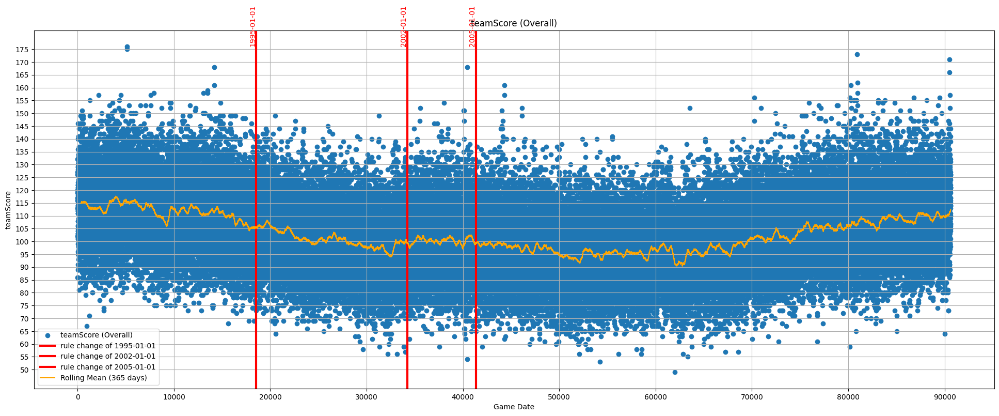

In [21]:
dataframes_to_plot = [team_stat_df_three_point_line_introduced,
                      team_stat_df_three_point_line_moved,
                      team_stat_df_zone_defense_legalized,
                      team_stat_df_hand_checking_banned]

plot_time_series_separated(team_stat_ui_df, 'teamScore',  separation_dates=separation_indexes, rolling_mean_window_size=365, fig_rowsize=9, yticks=np.arange(50, 180, 5), sep_line_width=3)

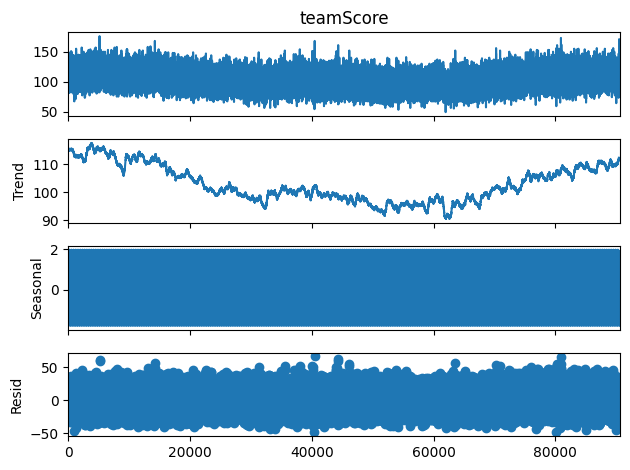

In [22]:
decomposition = seasonal_decompose(team_stat_ui_df["teamScore"], model='additive', period=365)
decomposition.plot()
plt.show()

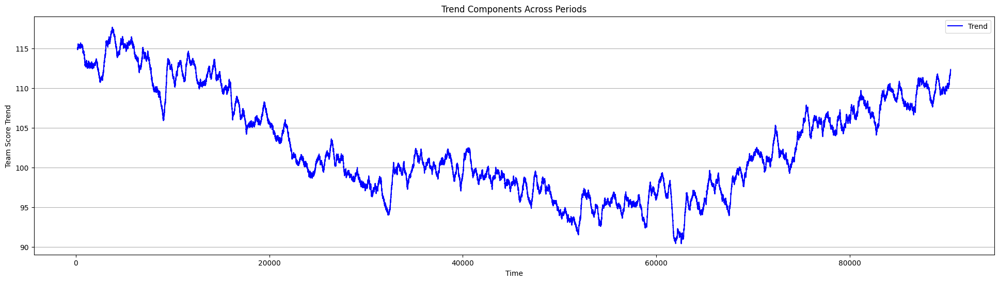

In [23]:
# plot the trends nicely
trend_overall = decomposition.trend

# to df
trend_overall = pd.DataFrame(trend_overall)
trend_overall.columns = ["trend"]


# Plot the trends
plt.figure(figsize=(24, 6))
plt.plot(trend_overall, label='Trend', color='blue')
plt.grid(axis = 'y')

# Add labels and legend
plt.title('Trend Components Across Periods')
plt.xlabel('Time')
plt.ylabel('Team Score Trend')
plt.legend()
plt.show()

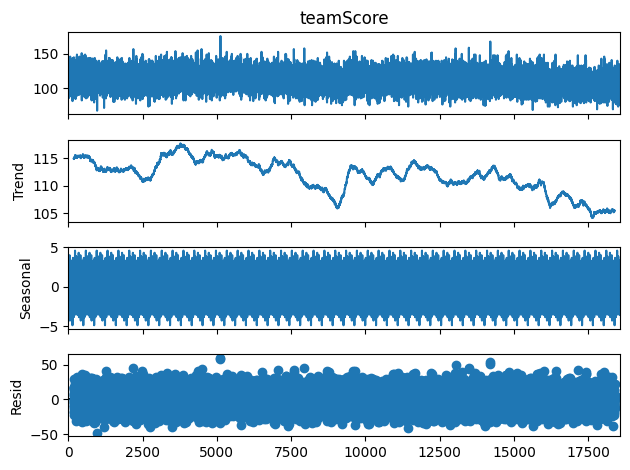

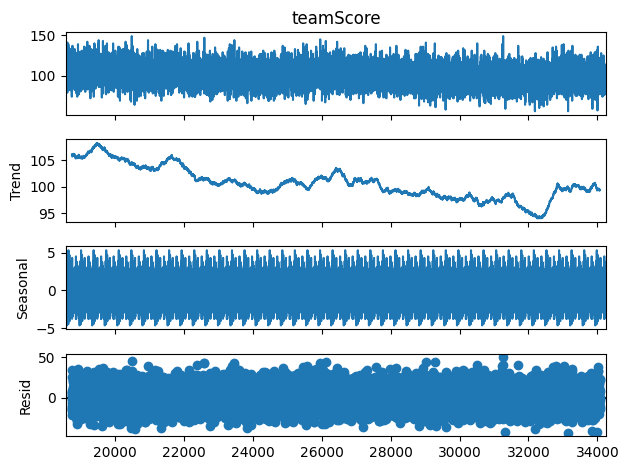

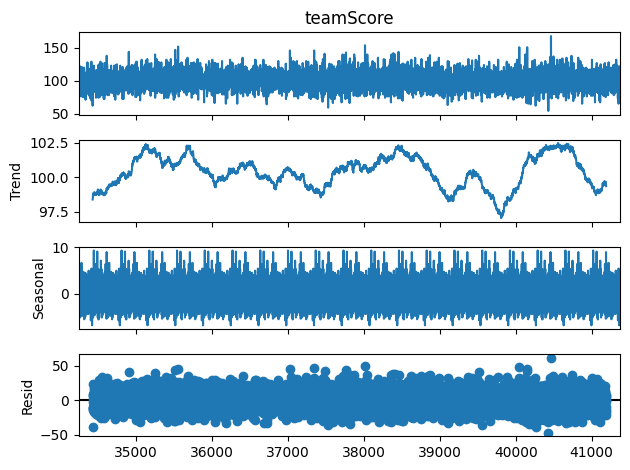

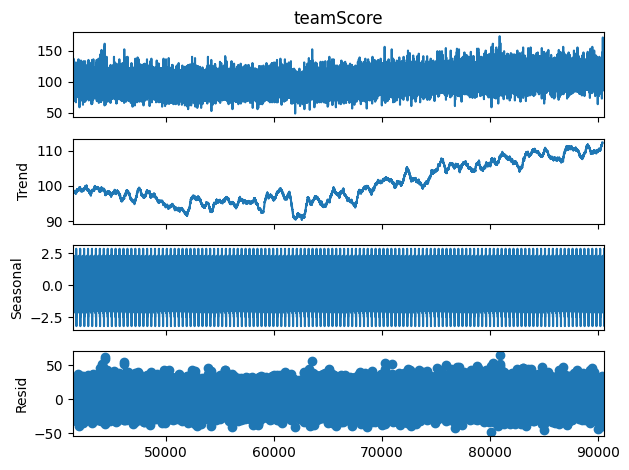

In [24]:
## seasonal decompose on each period
decomposition_three_point_line_introduced = seasonal_decompose(team_stat_df_three_point_line_introduced["teamScore"], model='additive', period=365)
decomposition_three_point_line_introduced.plot()
plt.show()

decomposition_three_point_line_moved = seasonal_decompose(team_stat_df_three_point_line_moved["teamScore"], model='additive', period=365)
decomposition_three_point_line_moved.plot()
plt.show()

decomposition_zone_defense_legalized = seasonal_decompose(team_stat_df_zone_defense_legalized["teamScore"], model='additive', period=365)
decomposition_zone_defense_legalized.plot()
plt.show()

decomposition_hand_checking_banned = seasonal_decompose(team_stat_df_hand_checking_banned["teamScore"], model='additive', period=365)
decomposition_hand_checking_banned.plot()
plt.show()

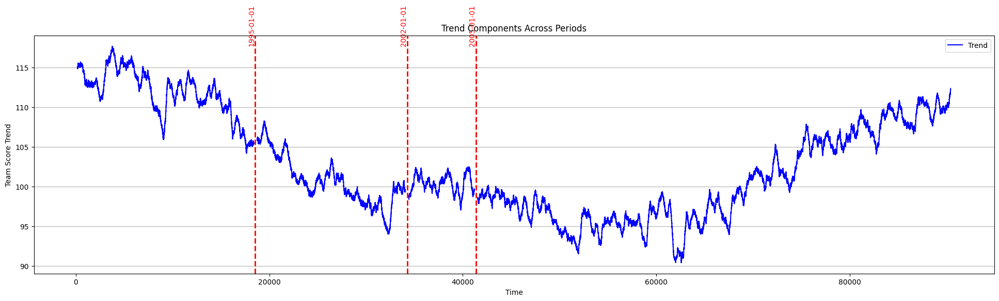

In [93]:
# Extract trends
trends = [
    decomposition_hand_checking_banned.trend,
    decomposition_zone_defense_legalized.trend,
    decomposition_three_point_line_moved.trend,
    decomposition_three_point_line_introduced.trend,
]

# Combine trends into a single series
trend_combined = pd.concat(trends)

# Plot the trends
plt.figure(figsize=(24, 6))
plt.plot(trend_combined, label='Trend', color='blue')
plt.grid(axis = 'y')

# Add vertical separation lines
for index, date in separation_indexes:
    plt.axvline(x=index, color='red', linestyle='--', linewidth=2)
    plt.text(index, trend_combined.max(), date, ha='right', va='bottom', color='red', rotation=90)

# Add labels and legend
plt.title('Trend Components Across Periods')
plt.xlabel('Time')
plt.ylabel('Team Score Trend')
plt.legend()
plt.show()

[98.60547945 98.59452055 98.52054795 98.48219178 98.44383562 98.43561644
 98.47123288 98.5369863  98.4630137  98.50684932]
[98.38630137 98.40821918 98.44931507 98.54520548 98.64931507 98.65753425
 98.69315068 98.73424658 98.81643836 98.82191781]
[106.09589041 106.03287671 106.07123288 106.07123288 106.07123288
 106.12054795 106.07671233 105.95890411 105.91506849 105.90958904]
[114.86575342 114.82191781 114.89315068 114.87671233 114.91780822
 114.9890411  114.98630137 114.97808219 114.91232877 114.87945205]


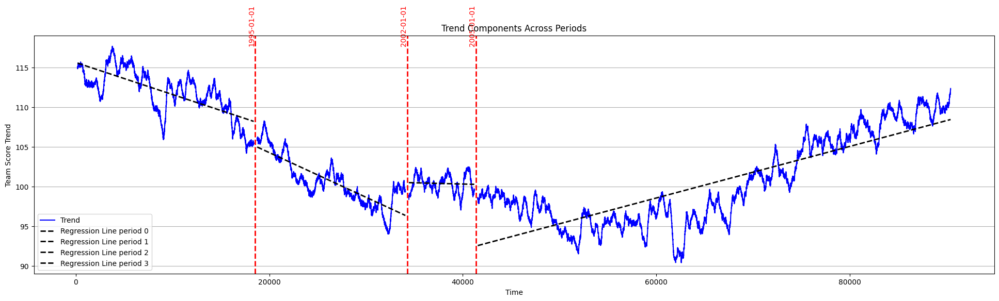

In [95]:
# Plot the trends
plt.figure(figsize=(24, 6))
plt.plot(trend_combined, label='Trend', color='blue')
plt.grid(axis = 'y')

# Add vertical separation lines
for index, date in separation_indexes:
    plt.axvline(x=index, color='red', linestyle='--', linewidth=2)
    plt.text(index, trend_combined.max(), date, ha='right', va='bottom', color='red', rotation=90)

# calculate linear regresssions
for i, trend in enumerate(trends):
    trend = trend.dropna()
    x = np.arange(len(trend))
    y = trend.values
    print(y[:10])
    slope, intercept, _, _, _ = linregress(x, y)
    regression_line = slope * x + intercept
    plt.plot(trend.index, regression_line, linestyle='--', label=f'Regression Line period {i}', color='black', linewidth=2)

# Add labels and legend
plt.title('Trend Components Across Periods')
plt.xlabel('Time')
plt.ylabel('Team Score Trend')
plt.legend()
plt.show()

### Influence of rule changes

- the rule change in 1995 did not really affect the already ongoing decrease in the total score achieved by the teams.
- the rule change in 2002 might have had an influence, but we don't want to emphasize that correlation is causalization
- for the rule change in 2005 there might not have been a strong influence. because even though the linear regression line goes up again, it was only years later when the teamScore was increasing again
- thus we can conclude that the rule changes, did not have a major part in influencing the teamScores

### Now more generally on all attributes

In [123]:
def seasonal_decompose_dfs(dfs, col: str, show_plots=False, period=365):
    decompositions = []
    for i, df in enumerate(dfs):
        decomposition = seasonal_decompose(df[col], model='additive', period=period)
        decompositions.append(decomposition)
        if show_plots:
            decomposition.plot()
            plt.show()
    return decompositions

def plot_trends(decompositions: list, separation_indexes: list[int, str], col: str):
    # decompositions: list of decompositions
    # separation_index: [(index, date-str),]
    trends_combined_list = [t.trend for t in decompositions]
    trends_combined = pd.concat(trends_combined_list)

    # plot
    plt.figure(figsize=(24, 6))
    plt.plot(trends_combined, label=f'Trend {col}', color='blue')
    plt.grid(axis = 'y')

    # vertical separation lines
    for index, date in separation_indexes:
        plt.axvline(x=index, color='red', linestyle='--', linewidth=2)
        plt.text(index, trends_combined.max(), date, ha='right', va='bottom', color='red', rotation=90)

    # calculate linear regresssions
    for i, trend in enumerate(trends_combined_list):
        trend = trend.dropna()
        x = np.arange(len(trend))
        y = trend.values
        slope, intercept, _, _, _ = linregress(x, y)
        regression_line = slope * x + intercept
        plt.plot(trend.index, regression_line, linestyle='--', label=f'Regression Line period {i}', color='black', linewidth=2)

    # Add labels and legend
    plt.title(f'Trend Components Across Periods of {col}')
    plt.xlabel('Time')
    plt.ylabel(col)
    plt.legend()
    plt.show()


In [124]:
team_stat_df_three_point_line_introduced.columns

Index(['gameId', 'teamCity', 'teamName', 'opponentTeamCity',
       'opponentTeamName', 'home', 'win', 'teamScore', 'opponentScore',
       'threePointersPercentage', 'freeThrowsPercentage',
       'assistsPerPossession', 'blocksPerPossession', 'stealsPerPossession',
       'threePointersAttemptedPerPossession',
       'freeThrowsAttemptedPerPossession', 'reboundsDefensivePerPossession',
       'reboundsOffensivePerPossession', 'foulsPersonalPerPossession',
       'turnoversPerPossession', 'effectiveFieldGoalPercentage',
       'trueShootingPercentage', 'gameDate'],
      dtype='object')

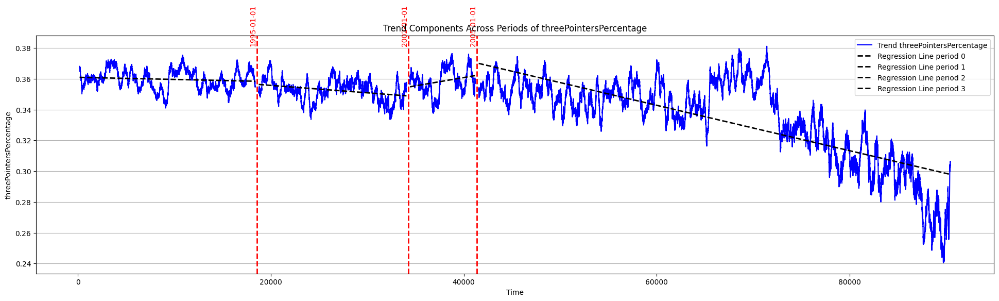

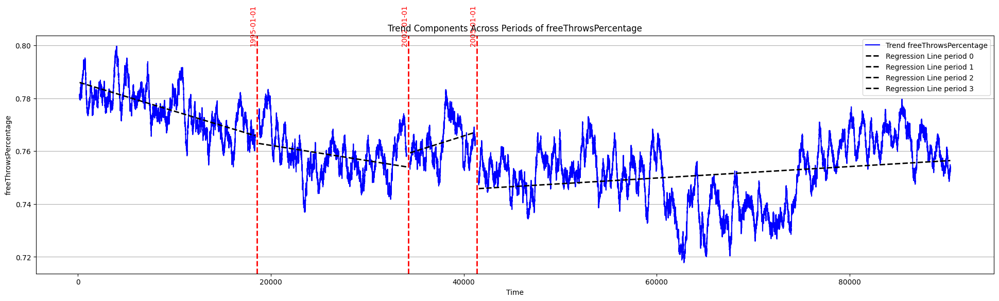

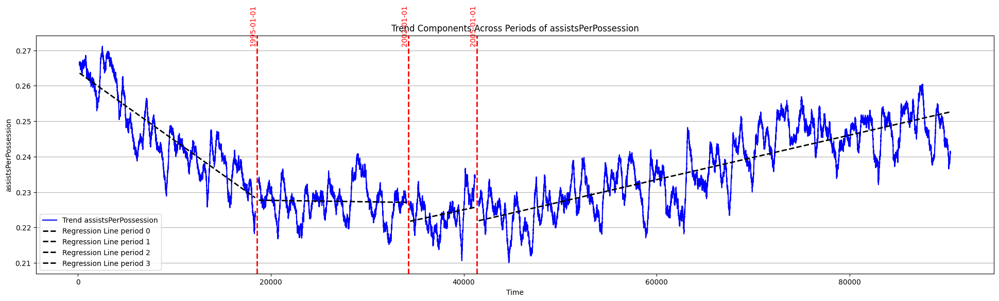

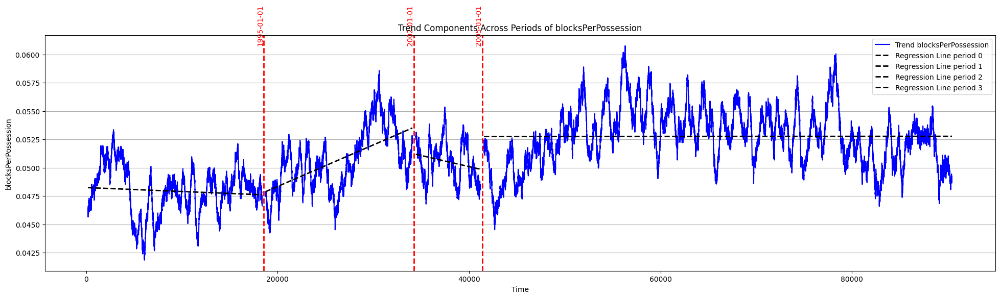

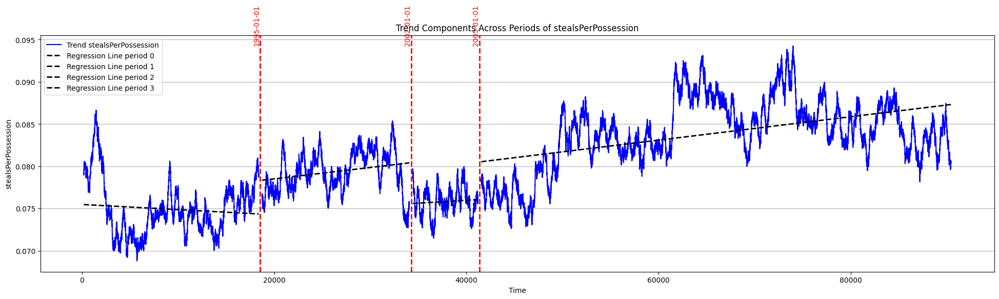

...

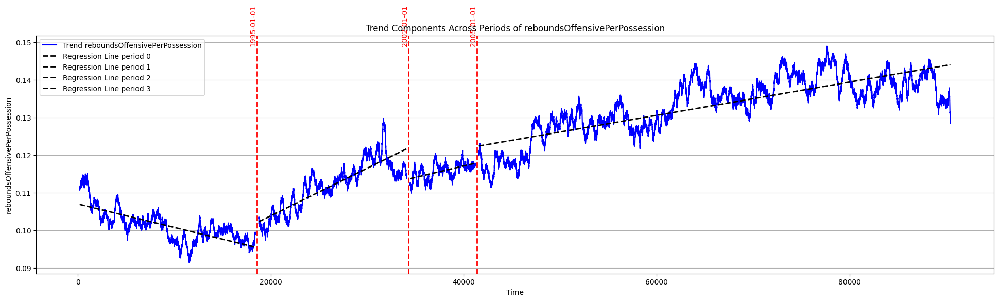

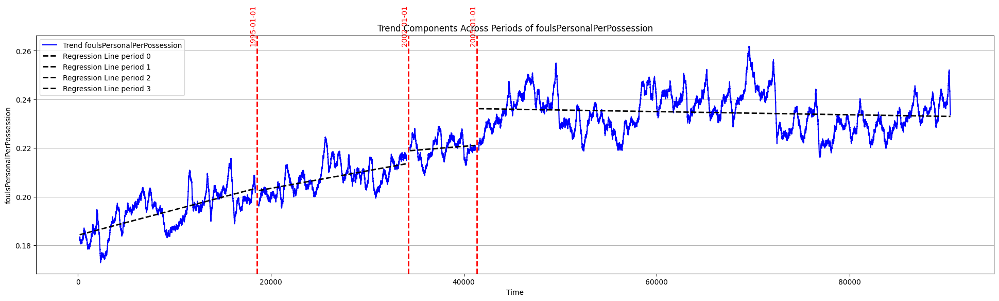

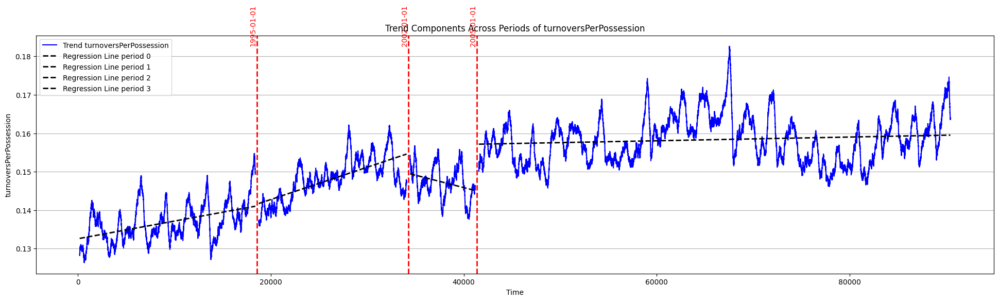

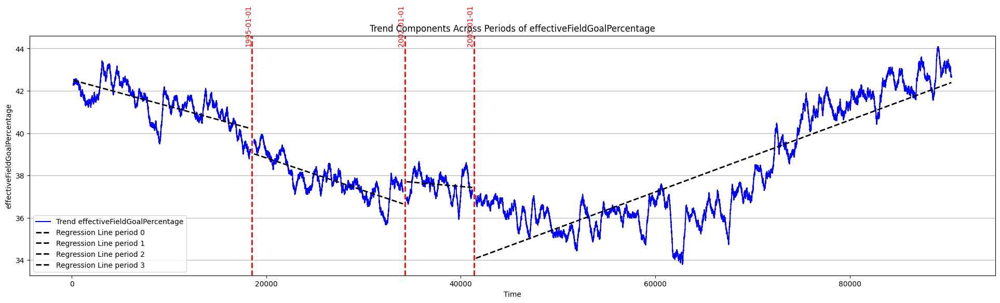

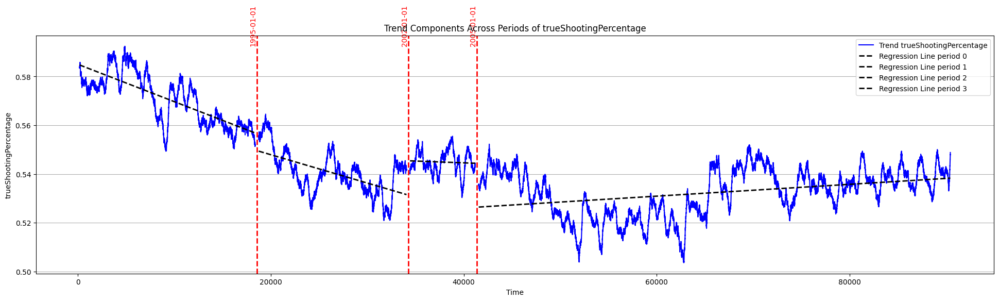

In [126]:
cols = ['threePointersPercentage', 'freeThrowsPercentage',
        'assistsPerPossession', 'blocksPerPossession', 'stealsPerPossession',
        'threePointersAttemptedPerPossession',
        'freeThrowsAttemptedPerPossession', 'reboundsDefensivePerPossession',
        'reboundsOffensivePerPossession', 'foulsPersonalPerPossession',
        'turnoversPerPossession', 'effectiveFieldGoalPercentage',
        'trueShootingPercentage',
        #"teamScore"
        ]

for col in cols:
    decompositions = seasonal_decompose_dfs([team_stat_df_three_point_line_introduced,
                      team_stat_df_three_point_line_moved,
                      team_stat_df_zone_defense_legalized,
                      team_stat_df_hand_checking_banned], col, show_plots=False)

    plot_trends(decompositions, separation_indexes, col)



Recall Key Rule Changes:
- 1980: Three-Point Line introduced
- 1995: Three-Point Line moved closer and stricter hand-checking rules
- 2002: Zone Defense Legalized
- 2005: Hand Checking Banned Permanently


- threePointersPercentage: Might look like the 2005 rule has an influence, but the actual decrease is only late after that
  - No influences at all
- freeThrowsPercentage: No influence
- **assistsPerPossession**: Stopped immediately after 1995 rule introduction, and then increased again after 2002 hand checking banned rule
  - Has influence
- blocksPerPossesion: Hard to tell
- stealsPerPossession: Looks more random than anything else
  - No influence
- **threePointersAttemptedPerPossession**: (no) influence?
  - But interesting that trend is always decreasing, except for the perid after the 2002 zone defence legalized
- freeThrowsAttemptedPerPossession: No inluence
- *reboundsDefensivePerPossession*:
  - Again something like with the threePointersPercentage, must have something after index ~60000 that caused a decrease
- **reboundsOffensivePerPossession**:
  - influence of 1995 rule that correlates with that significant increase after 1995 until 2002
  - Maybe also correlation with 2005 rule and increase
- **foulsPersonalPerPossession**: rule change in 2005 might have had an influence, because after that the fouls stopped increasing
  - Influence
- **turnoversPerPossession**:
  - 2002 rule correlates with sudden decrease in turnoves after monotonic increase before
- effectiveFieldGoalPercentage
  - again something in around ~60000 that caused an increase in field goals
- trueShootingPercentage: Hard to tell